In [1]:
import numpy as no
import pandas as panda
import matplotlib.pyplot as plt
import json

In [2]:
!pip install gdown

In [3]:
# from google.colab import drive
# drive.mount('/content/drive')
import gdown
# id = "11YeloR2eTXcTzdwI04Z-M2QVvIeQAU6-"
id = "1G-XttJCGvkAVkU9N_W_PxR0Cx099qbUa"
gdown.download_folder(id=id, quiet=True, use_cookies=False)

['/content/SubtaskB/subtaskB_dev.jsonl',
 '/content/SubtaskB/subtaskB_train.jsonl']

In [4]:
# Open the JSONL file and read its contents
with open('/content/SubtaskB/subtaskB_train.jsonl', 'r') as file:
    lines = file.readlines()

# Parse each line as a JSON object
train_objects = [json.loads(line) for line in lines]

with open('/content/SubtaskB/subtaskB_dev.jsonl', 'r') as file:
    lines = file.readlines()

# Parse each line as a JSON object
test_objects = [json.loads(line) for line in lines]

In [ ]:
# Create a dataframe from the JSON objects
train_df = panda.DataFrame(train_objects)

train_df

,text,model,source,label,id
0,Forza Motorsport is a popular racing game that...,chatGPT,wikihow,1,0
1,Buying Virtual Console games for your Nintendo...,chatGPT,wikihow,1,1
2,Windows NT 4.0 was a popular operating system ...,chatGPT,wikihow,1,2
3,How to Make Perfume\n\nPerfume is a great way ...,chatGPT,wikihow,1,3
4,How to Convert Song Lyrics to a Song'\n\nConve...,chatGPT,wikihow,1,4
...,...,...,...,...,...
71022,"During the Cold War, the United States was po...",cohere,reddit,2,71022
71023,"The ""continuity thesis"" is the idea that ther...",cohere,reddit,2,71023
71024,"In the early Middle Ages, the pagan Norse wer...",cohere,reddit,2,71024
71025,There are many similarities between the langu...,cohere,reddit,2,71025


In [ ]:
test_df = panda.DataFrame(test_objects)

test_df

,text,model,source,label,id
0,"Overall, I found the paper ""Machine Comprehens...",chatGPT,peerread,1,1844
1,"This paper ""Machine Comprehension Using Match-...",chatGPT,peerread,1,1845
2,The paper presents an end-to-end neural archit...,chatGPT,peerread,1,1846
3,This paper proposes an end-to-end neural archi...,chatGPT,peerread,1,1847
4,Title: Incorporating long-range consistency in...,chatGPT,peerread,1,1848
...,...,...,...,...,...
2995,The paper Energy-Based Spherical Sparse Coding...,dolly,peerread,5,14560
2996,"Dear Author, I have reviewed your submitted pa...",dolly,peerread,5,14561
2997,Denoising Auto-Encoders (DAE) have been used i...,dolly,peerread,5,14562
2998,"The paper Revisiting Denoising Auto-Encoders, ...",dolly,peerread,5,14563


Text(0, 0.5, 'Number of texts')

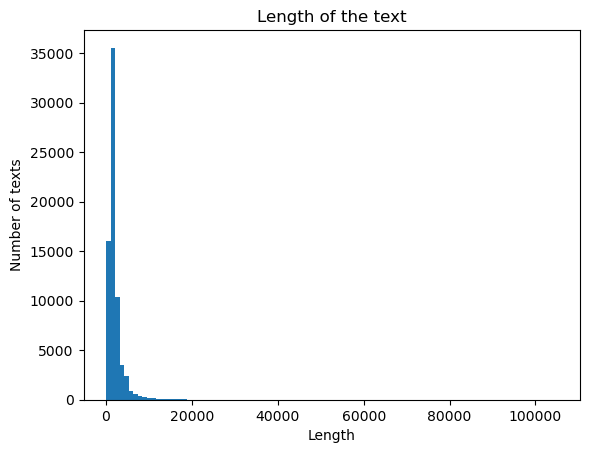

In [ ]:
# Add a column to the dataframe that contains the length of the tweet
train_df['length'] = train_df['text'].str.len()

# Plot the length of the tweets
train_df['length'].plot(bins=100, kind='hist')
plt.title('Length of the text')
plt.xlabel('Length')
plt.ylabel('Number of texts')

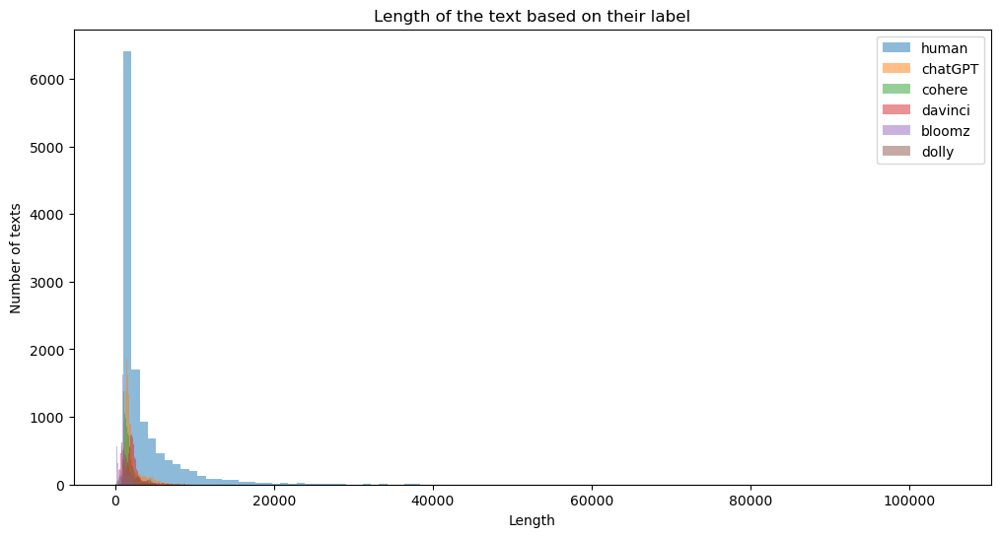

In [ ]:
# Plot the length of the tweets based on their label
ax , fig = plt.subplots(figsize=(12, 6))
ax = plt.hist(train_df[train_df['label'] == 0]['length'], bins=100, alpha=0.5, label='human')
ax = plt.hist(train_df[train_df['label'] == 1]['length'], bins=100, alpha=0.5, label='chatGPT')
ax = plt.hist(train_df[train_df['label'] == 2]['length'], bins=100, alpha=0.5, label='cohere')
ax = plt.hist(train_df[train_df['label'] == 3]['length'], bins=100, alpha=0.5, label='davinci')
ax = plt.hist(train_df[train_df['label'] == 4]['length'], bins=100, alpha=0.5, label='bloomz')
ax = plt.hist(train_df[train_df['label'] == 5]['length'], bins=100, alpha=0.5, label='dolly')
plt.legend(loc='upper right')
plt.title('Length of the text based on their label')
plt.xlabel('Length')
plt.ylabel('Number of texts')
plt.show()

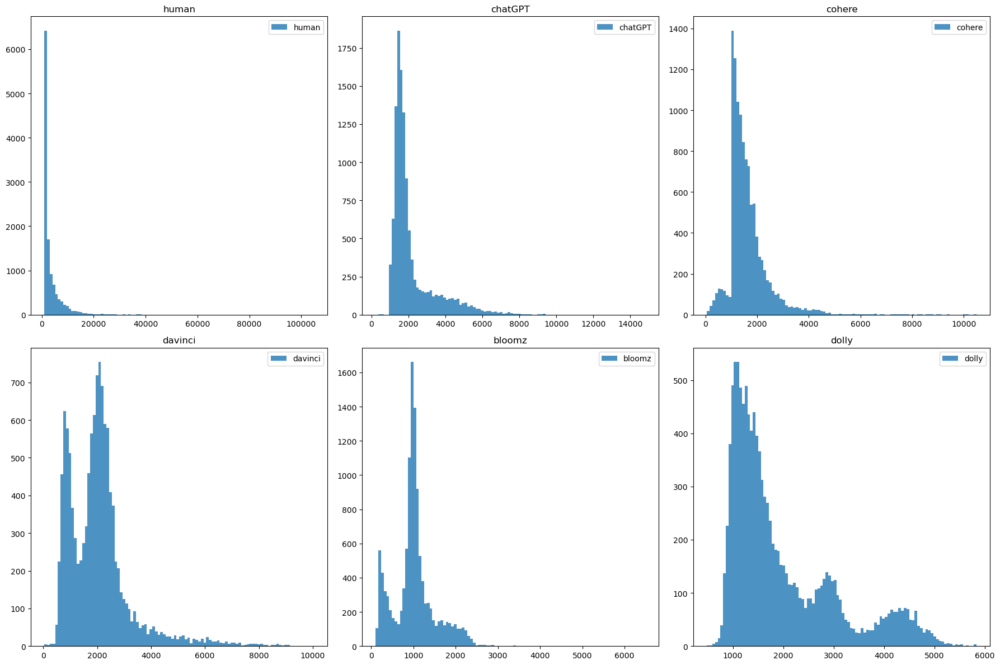

In [ ]:
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

labels = ['human', 'chatGPT', 'cohere', 'davinci', 'bloomz', 'dolly']

for i, ax in enumerate(axes.flatten()):
    ax.hist(train_df[train_df['label'] == i]['length'], bins=100, alpha=0.8, label=labels[i])
    ax.set_title(labels[i])
    ax.legend(loc='upper right')
    xticks = ax.xaxis.get_major_ticks()

plt.tight_layout()
plt.show()

In [ ]:
from transformers import RobertaTokenizer, RobertaModel

# Load pre-trained BERT model and tokenizer
model_name = 'roberta-large'
tokenizer = RobertaTokenizer.from_pretrained(model_name)
# bert_model = RobertaModel.from_pretrained(model_name)

c:\Users\Amirreza\.conda\envs\deeplearning\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Token indices sequence length is longer than the specified maximum sequence length for this model (556 > 512). Running this sequence through the model will result in indexing errors


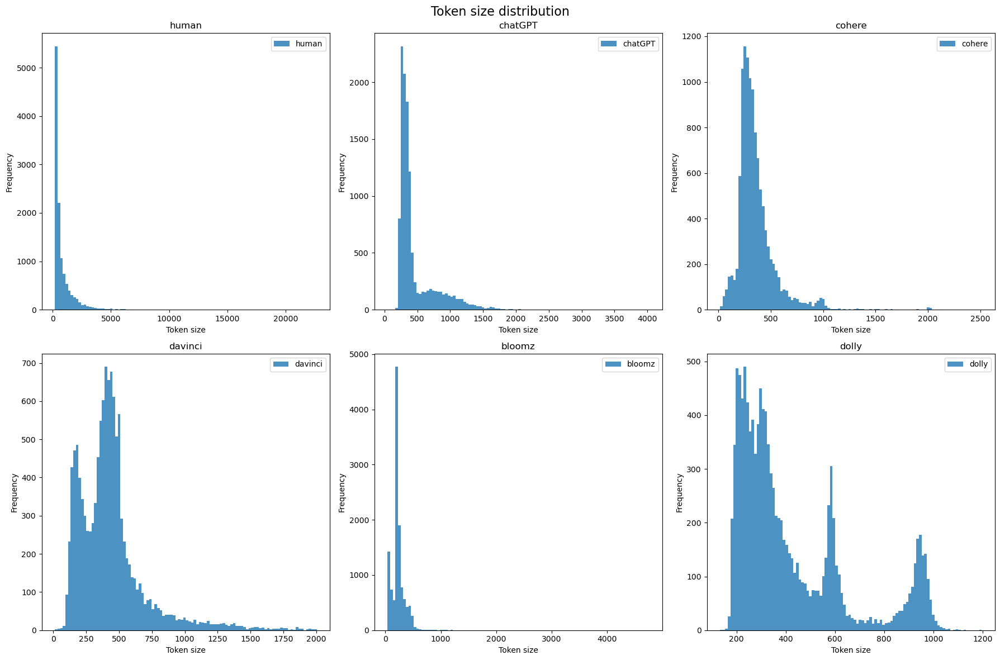

In [ ]:
# Tokenize the dataset
tokenized_data = train_df['text'].apply(lambda x: tokenizer.encode(x, add_special_tokens=True))

# Add a column to the dataframe that contains the token size
train_df['token_size'] = tokenized_data.apply(lambda x: len(x))

# Create subplots
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

labels = ['human', 'chatGPT', 'cohere', 'davinci', 'bloomz', 'dolly']

for i, ax in enumerate(axes.flatten()):
    ax.hist(train_df[train_df['label'] == i]['token_size'], bins=100, alpha=0.8, label=labels[i])
    ax.set_title(labels[i])
    ax.legend(loc='upper right')
    ax.set_xlabel('Token size')
    ax.set_ylabel('Frequency')
    xticks = ax.xaxis.get_major_ticks()

fig.suptitle('Token size distribution', fontsize=16)
fig.tight_layout()
plt.show()


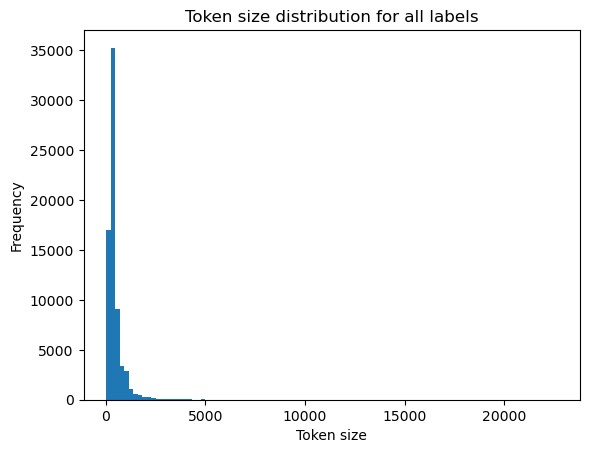

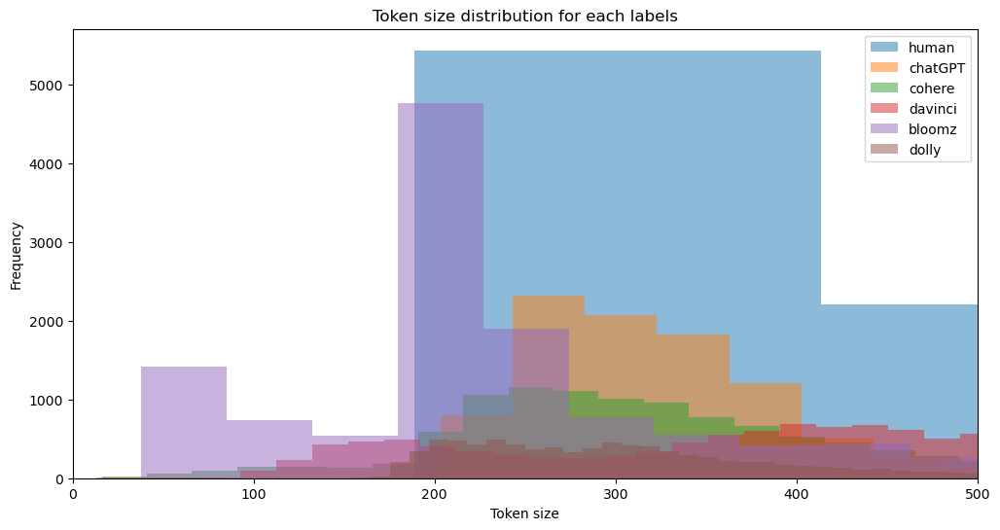

In [ ]:
# Plot the length of the tokens
train_df['token_size'].plot(bins=100, kind='hist')
# Xlabel
plt.xlabel('Token size')
# Ylabel
plt.ylabel('Frequency')
plt.title('Token size distribution for all labels')

# Plot the length of the tokens based on their label
ax , fig = plt.subplots(figsize=(12, 6))
ax = plt.hist(train_df[train_df['label'] == 0]['token_size'], bins=100, alpha=0.5, label='human')
ax = plt.hist(train_df[train_df['label'] == 1]['token_size'], bins=100, alpha=0.5, label='chatGPT')
ax = plt.hist(train_df[train_df['label'] == 2]['token_size'], bins=100, alpha=0.5, label='cohere')
ax = plt.hist(train_df[train_df['label'] == 3]['token_size'], bins=100, alpha=0.5, label='davinci')
ax = plt.hist(train_df[train_df['label'] == 4]['token_size'], bins=100, alpha=0.5, label='bloomz')
ax = plt.hist(train_df[train_df['label'] == 5]['token_size'], bins=100, alpha=0.5, label='dolly')
plt.legend(loc='upper right')
plt.xlabel('Token size')
plt.ylabel('Frequency')
plt.title('Token size distribution for each labels')
# xlim
plt.xlim(0, 500)
plt.show()

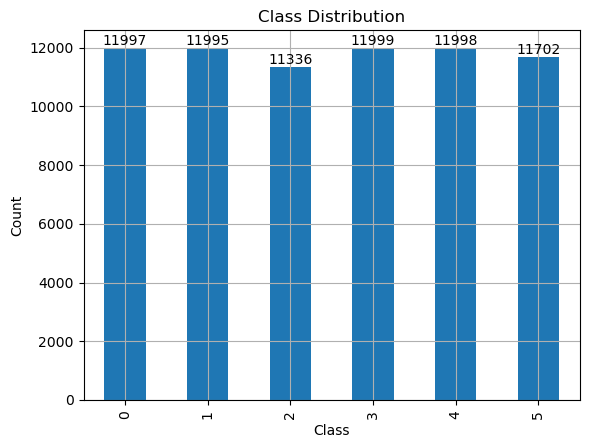

In [ ]:
# Count the number of samples for each class
class_counts = train_df['label'].value_counts()

# Sort the class counts by label
class_counts = class_counts.sort_index()

# Visualize the class distribution
ax = class_counts.plot(kind='bar')
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.grid()

# Add value labels to the bars
for i, v in enumerate(class_counts):
    ax.text(i, v, str(v), ha='center', va='bottom')

plt.show()


# Data cleaning

In [ ]:
train_df['text'].unique().shape
train_df.isnull().sum()

text          0
model         0
source        0
label         0
id            0
length        0
token_size    0
dtype: int64

### Expand Contractions

In [ ]:
# For regular expressions
import re

# Dictionary of English Contractions
contractions_dict = { "ain't": "are not","'s":" is","aren't": "are not",
                     "can't": "cannot","can't've": "cannot have",
                     "'cause": "because","could've": "could have","couldn't": "could not",
                     "couldn't've": "could not have", "didn't": "did not","doesn't": "does not",
                     "don't": "do not","hadn't": "had not","hadn't've": "had not have",
                     "hasn't": "has not","haven't": "have not","he'd": "he would",
                     "he'd've": "he would have","he'll": "he will", "he'll've": "he will have",
                     "how'd": "how did","how'd'y": "how do you","how'll": "how will",
                     "I'd": "I would", "I'd've": "I would have","I'll": "I will",
                     "I'll've": "I will have","I'm": "I am","I've": "I have", "isn't": "is not",
                     "it'd": "it would","it'd've": "it would have","it'll": "it will",
                     "it'll've": "it will have", "let's": "let us","ma'am": "madam",
                     "mayn't": "may not","might've": "might have","mightn't": "might not",
                     "mightn't've": "might not have","must've": "must have","mustn't": "must not",
                     "mustn't've": "must not have", "needn't": "need not",
                     "needn't've": "need not have","o'clock": "of the clock","oughtn't": "ought not",
                     "oughtn't've": "ought not have","shan't": "shall not","sha'n't": "shall not",
                     "shan't've": "shall not have","she'd": "she would","she'd've": "she would have",
                     "she'll": "she will", "she'll've": "she will have","should've": "should have",
                     "shouldn't": "should not", "shouldn't've": "should not have","so've": "so have",
                     "that'd": "that would","that'd've": "that would have", "there'd": "there would",
                     "there'd've": "there would have", "they'd": "they would",
                     "they'd've": "they would have","they'll": "they will",
                     "they'll've": "they will have", "they're": "they are","they've": "they have",
                     "to've": "to have","wasn't": "was not","we'd": "we would",
                     "we'd've": "we would have","we'll": "we will","we'll've": "we will have",
                     "we're": "we are","we've": "we have", "weren't": "were not","what'll": "what will",
                     "what'll've": "what will have","what're": "what are", "what've": "what have",
                     "when've": "when have","where'd": "where did", "where've": "where have",
                     "who'll": "who will","who'll've": "who will have","who've": "who have",
                     "why've": "why have","will've": "will have","won't": "will not",
                     "won't've": "will not have", "would've": "would have","wouldn't": "would not",
                     "wouldn't've": "would not have","y'all": "you all", "y'all'd": "you all would",
                     "y'all'd've": "you all would have","y'all're": "you all are",
                     "y'all've": "you all have", "you'd": "you would","you'd've": "you would have",
                     "you'll": "you will","you'll've": "you will have", "you're": "you are",
                     "you've": "you have"}

# Regular expression for finding contractions
contractions_re=re.compile('(%s)' % '|'.join(contractions_dict.keys()))

# Function for expanding contractions
def expand_contractions(text,contractions_dict=contractions_dict):
  def replace(match):
    return contractions_dict[match.group(0)]
  return contractions_re.sub(replace, text)

# Expanding Contractions in the reviews
train_df['text']=train_df['text'].apply(lambda x:expand_contractions(x))

### Lowercase the text

In [ ]:
train_df['cleaned']=train_df['text'].apply(lambda x: x.lower())

### Remove digits and words containing digits

In [ ]:
train_df['cleaned']=train_df['cleaned'].apply(lambda x: re.sub('\w*\d\w*','', x))

### Remove Punctuations

In [ ]:
import string
train_df['cleaned']=train_df['cleaned'].apply(lambda x: re.sub('[%s]' % re.escape(string.punctuation), '', x))

# Removing extra spaces
train_df['cleaned']=train_df['cleaned'].apply(lambda x: re.sub(' +',' ',x))

In [ ]:
for index,text in enumerate(train_df['text'][38:40]):
    print('text %d:\n'%(index+1),text)

text 1:
 Rough wiring a home can be a time-consuming task, but with the right approach, you can make it more efficient. However, it’s important to put safety first, focus on correctness and quality, and work quickly, but mostly, efficiently. Here are some steps to follow to ensure that you rough wire homes more efficiently.

Step 1: Make a Plan

To reduce your steps and save time, it’s crucial to make a plan before you start wiring. Redraw the floor plan to reduce your "travel," and prepare all your notes and plans for the actual wiring.

Step 2: Organize Your Tasks

Once you have a plan, organize your tasks for action. Start your day by combining tasks 1 and 2, followed by your first non-combo (a task that’s easier to keep left alone).

Step 3: Mark the First Floor

Mark the first floor now, including basement home runs. Move on to marking the basement, but don’t burden yourself by trying to carry too much at once. Begin the task that’s the first one that saves more than half the time

In [ ]:
for index,text in enumerate(train_df['cleaned'][38:40]):
    print('text %d:\n'%(index+1),text)

text 1:
 rough wiring a home can be a timeconsuming task but with the right approach you can make it more efficient however it’s important to put safety first focus on correctness and quality and work quickly but mostly efficiently here are some steps to follow to ensure that you rough wire homes more efficiently

step make a plan

to reduce your steps and save time it’s crucial to make a plan before you start wiring redraw the floor plan to reduce your travel and prepare all your notes and plans for the actual wiring

step organize your tasks

once you have a plan organize your tasks for action start your day by combining tasks and followed by your first noncombo a task that’s easier to keep left alone

step mark the first floor

mark the first floor now including basement home runs move on to marking the basement but don’t burden yourself by trying to carry too much at once begin the task that’s the first one that saves more than half the time

step start another task

start another 

In [ ]:
# Grouping text by label
df_grouped=train_df[['cleaned','label']].groupby('label').agg(lambda x:' '.join(x))
df_grouped.head()

,cleaned
label,
0,it will work with the forza motorsport disc i...
1,forza motorsport is a popular racing game that...
2,\n\nhow to play forza motorsport\nthis wikihow...
3,\n\nplaying forza motorsport can be an excitin...
4,forza motorsport also known as forza was relea...


In [ ]:
import random
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np

# Creating Document Term Matrix
cv=CountVectorizer(analyzer='word')
data=cv.fit_transform(df_grouped['cleaned'])
df_dtm = panda.DataFrame(data.toarray(), columns=cv.get_feature_names_out())
df_dtm.index=df_grouped.index
df_dtm.head()

,aa,aaa,aaaa,aaaaa,aaaaaaaaa,aaaaaab,aaaaaabbc,aaaaaabbcaaa,aaaarrrrrrrrggghhh,aaab,...,𓃀𓈖𓃀𓈖𓉴,𓅮𓏏𓏖,𝐷𝑒𝑔𝑟𝑒𝑒𝑠,𝐸𝑞𝑢𝑎𝑡𝑖𝑜𝑛𝑠,𝐹𝑟𝑒𝑒𝑑𝑜𝑚,𝐹𝑟𝑒𝑒𝑑𝑜𝑚𝑁𝑢𝑚𝑏𝑒𝑟,𝑁𝑢𝑚𝑏𝑒𝑟,𝑈𝑛𝑘𝑜𝑤𝑛𝑠,𝑓𝑥𝑖,𝑜𝑓
label,,,,,,,,,,,,,,,,,,,,,
0,102,44,2,0,1,2,1,1,0,3,...,1,1,2,1,1,1,1,1,1,4
1,9,20,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,7,24,1,0,0,0,0,0,2,2,...,0,0,0,0,0,0,0,0,0,0
3,29,21,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,11,4,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


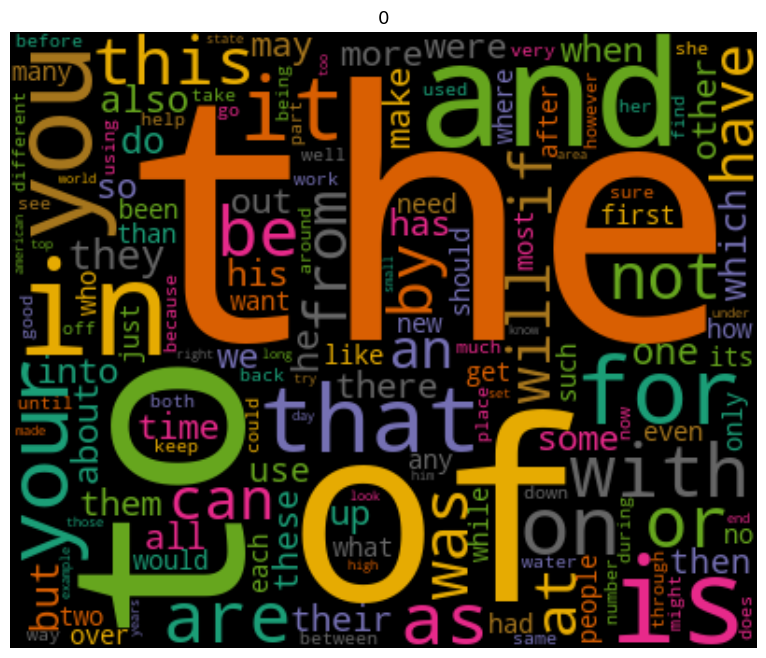

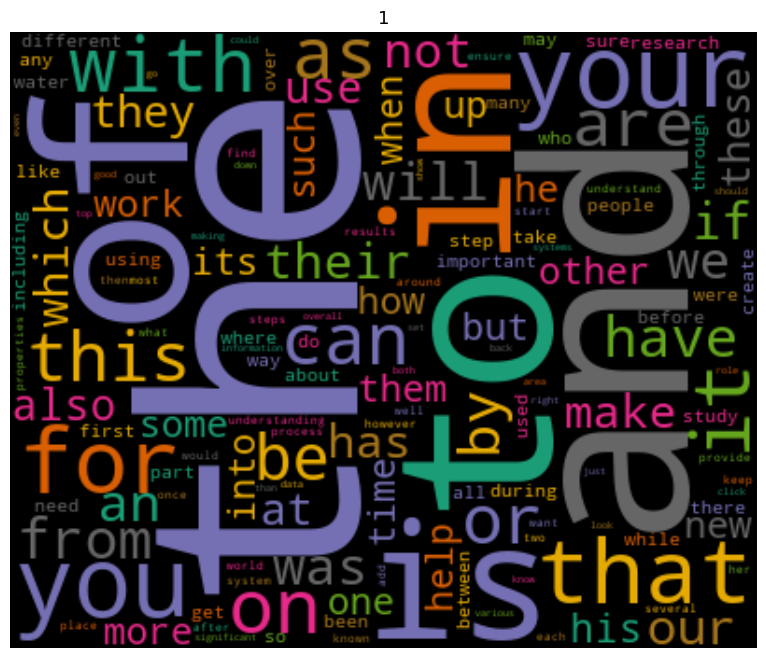

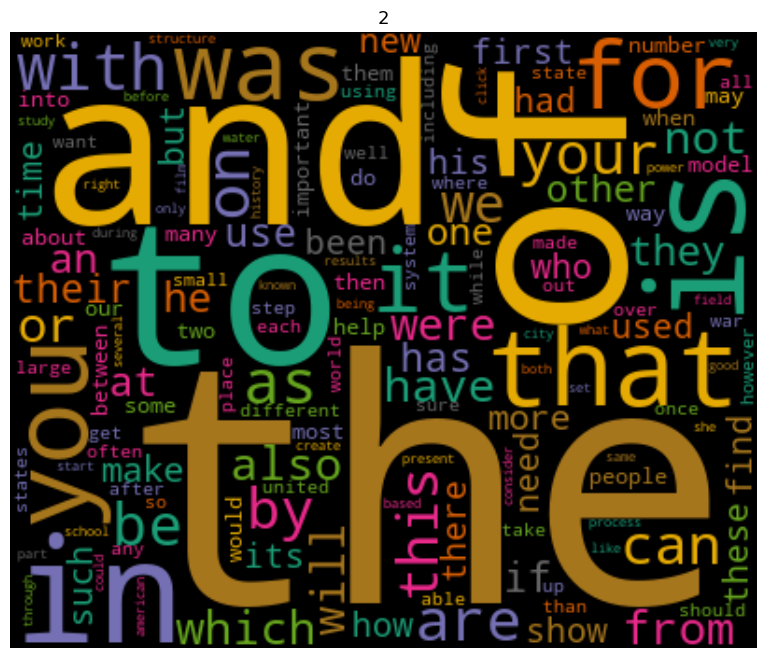

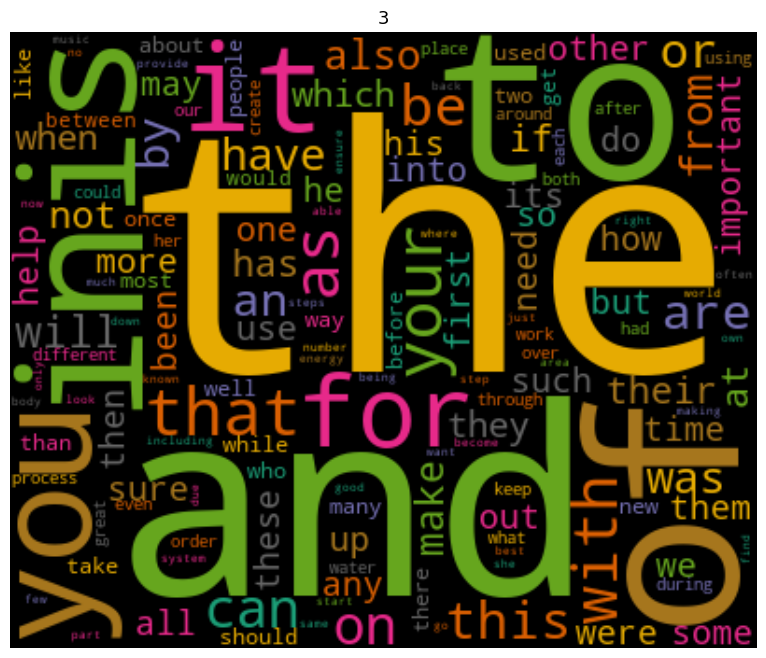

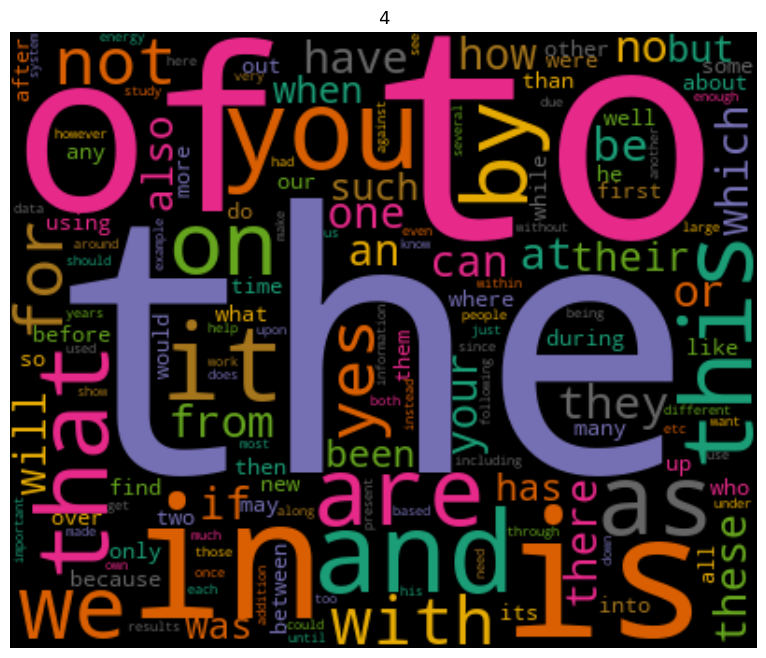

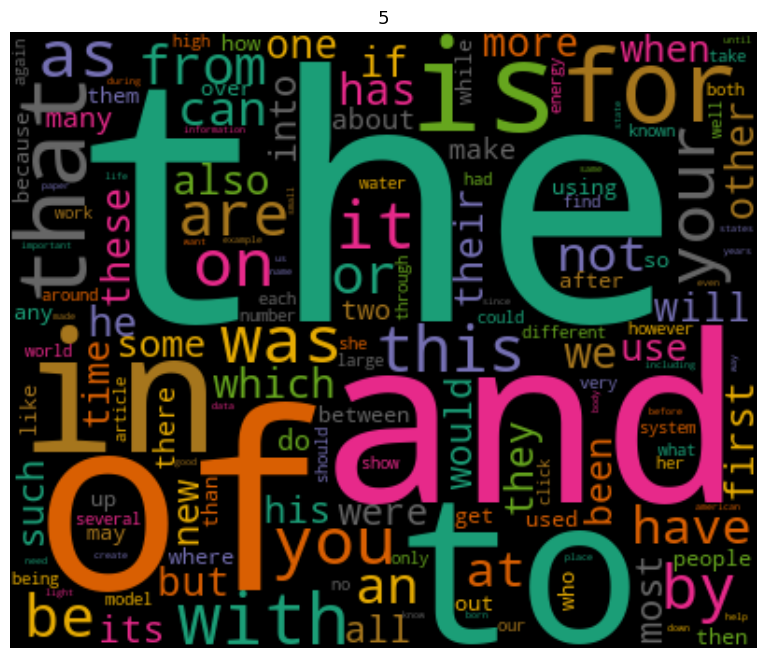

In [ ]:
# Importing wordcloud for plotting word clouds and textwrap for wrapping longer text
from wordcloud import WordCloud
from textwrap import wrap

# Function for generating word clouds
def generate_wordcloud(data,title):
  wc = WordCloud(width=400, height=330, max_words=150,colormap="Dark2").generate_from_frequencies(data)
  plt.figure(figsize=(10,8))
  plt.imshow(wc, interpolation='bilinear')
  plt.axis("off")
  plt.title('\n'.join(wrap(title,60)),fontsize=13)
  plt.show()

# Transposing document term matrix
df_dtm=df_dtm.transpose()

# Plotting word cloud for each label
for index,lebel in enumerate(df_dtm.columns):
  generate_wordcloud(df_dtm[lebel].sort_values(ascending=False),str(lebel))


In [ ]:
# Fit the CountVectorizer on the 'cleaned' column
cv.fit(train_df['cleaned'])

# Get the most frequent words
most_frequent_words = cv.get_feature_names_out()

# Convert the most frequent words to an array
most_frequent_words_array = np.array(most_frequent_words)

# Print the array of most frequent words
print(most_frequent_words_array)


['aa' 'aaa' 'aaaa' ... '𝑈𝑛𝑘𝑜𝑤𝑛𝑠' '𝑓𝑥𝑖' '𝑜𝑓']


In [ ]:
def corpus(text):
    text_list = text.split()
    return text_list

train_df['text_lists'] = train_df['cleaned'].apply(corpus)
train_df.head(10)

,text,model,source,label,id,length,token_size,cleaned,text_lists
0,Forza Motorsport is a popular racing game that...,chatGPT,wikihow,1,0,2244,556,forza motorsport is a popular racing game that...,"[forza, motorsport, is, a, popular, racing, ga..."
1,Buying Virtual Console games for your Nintendo...,chatGPT,wikihow,1,1,3728,887,buying virtual console games for your nintendo...,"[buying, virtual, console, games, for, your, n..."
2,Windows NT 4.0 was a popular operating system ...,chatGPT,wikihow,1,2,5237,1181,windows nt was a popular operating system back...,"[windows, nt, was, a, popular, operating, syst..."
3,How to Make Perfume\n\nPerfume is a great way ...,chatGPT,wikihow,1,3,4729,1155,how to make perfume\n\nperfume is a great way ...,"[how, to, make, perfume, perfume, is, a, great..."
4,How to Convert Song Lyrics to a Song'\n\nConve...,chatGPT,wikihow,1,4,3095,710,how to convert song lyrics to a song\n\nconver...,"[how, to, convert, song, lyrics, to, a, song, ..."
5,How to Fix a Broken Window in a Wooden Frame\n...,chatGPT,wikihow,1,5,3194,758,how to fix a broken window in a wooden frame\n...,"[how, to, fix, a, broken, window, in, a, woode..."
6,Publishing your WordPress theme on Themeforest...,chatGPT,wikihow,1,6,3091,671,publishing your wordpress theme on themeforest...,"[publishing, your, wordpress, theme, on, theme..."
7,Building a Railroad Tie Retaining Wall can be ...,chatGPT,wikihow,1,7,2568,578,building a railroad tie retaining wall can be ...,"[building, a, railroad, tie, retaining, wall, ..."
8,Teaching your dog new tricks is a great way to...,chatGPT,wikihow,1,8,4576,1086,teaching your dog new tricks is a great way to...,"[teaching, your, dog, new, tricks, is, a, grea..."
9,Remote Desktop is a useful tool that allows yo...,chatGPT,wikihow,1,9,3568,838,remote desktop is a useful tool that allows yo...,"[remote, desktop, is, a, useful, tool, that, a..."


In [ ]:
from tqdm import trange
from collections import Counter

corpus = []
for i in trange(train_df.shape[0], ncols=150, nrows=10, colour='green', smoothing=0.8):
    corpus += train_df['text_lists'][i]
len(corpus)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 71027/71027 [00:00<00:00, 75716.02it/s]


24204394

In [ ]:
mostCommon = Counter(corpus).most_common(10)
mostCommon

[('the', 1633892),
 ('of', 742673),
 ('and', 711459),
 ('to', 708731),
 ('a', 592344),
 ('in', 490790),
 ('is', 411054),
 ('you', 273578),
 ('that', 234873),
 ('for', 230166)]

In [ ]:
words = []
freq = []
for word, count in mostCommon:
    words.append(word)
    freq.append(count)

C:\Users\Amirreza\AppData\Local\Temp\ipykernel_27416\3100832279.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=freq, y=words ,palette='rocket')


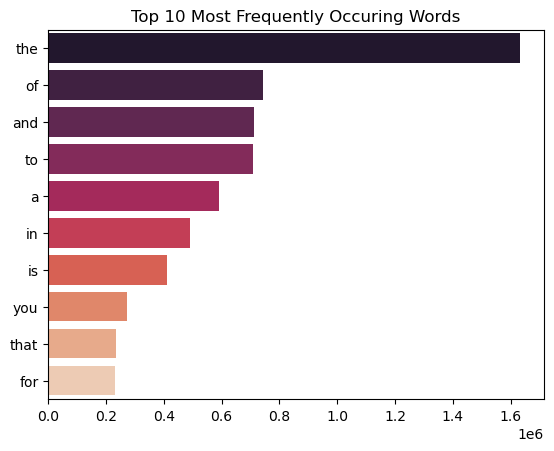

In [ ]:
import seaborn as sns

sns.barplot(x=freq, y=words ,palette='rocket')
plt.title('Top 10 Most Frequently Occuring Words')
plt.show()

### Most Frequently occuring N_grams

In [ ]:
cv = CountVectorizer(ngram_range=(2,2))
bigrams = cv.fit_transform(train_df['cleaned'])

count_values = bigrams.toarray().sum(axis=0)
ngram_freq = panda.DataFrame(sorted([(count_values[i], k) for k, i in cv.vocabulary_.items()], reverse = True))
ngram_freq.columns = ["frequency", "ngram"]
sns.barplot(x=ngram_freq['frequency'][:10], y=ngram_freq['ngram'][:10], palette='rocket')
plt.title('Top 10 Most Frequently Occurring Bigrams')
plt.show()

Because of the large size of the dataset, I will continue to work on the subset of the data.

(71027, 9)


C:\Users\Amirreza\AppData\Local\Temp\ipykernel_27416\3969541534.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ngram_freq['frequency'][:10], y=ngram_freq['ngram'][:10], palette='rocket')


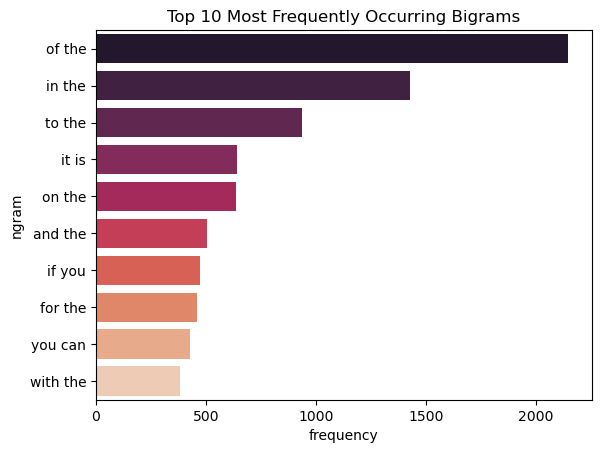

In [ ]:
print(train_df.shape)
train_df_sub = train_df.sample(frac=0.01, random_state=42)
train_df_sub.shape

cv = CountVectorizer(ngram_range=(2,2))
bigrams = cv.fit_transform(train_df_sub['cleaned'])

count_values = bigrams.toarray().sum(axis=0)
ngram_freq = panda.DataFrame(sorted([(count_values[i], k) for k, i in cv.vocabulary_.items()], reverse = True))
ngram_freq.columns = ["frequency", "ngram"]
sns.barplot(x=ngram_freq['frequency'][:10], y=ngram_freq['ngram'][:10], palette='rocket')
plt.title('Top 10 Most Frequently Occurring Bigrams')
plt.show()

C:\Users\Amirreza\AppData\Local\Temp\ipykernel_27416\2368410588.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ngram_freq['frequency'][:10], y=ngram_freq['ngram'][:10], palette='rocket')


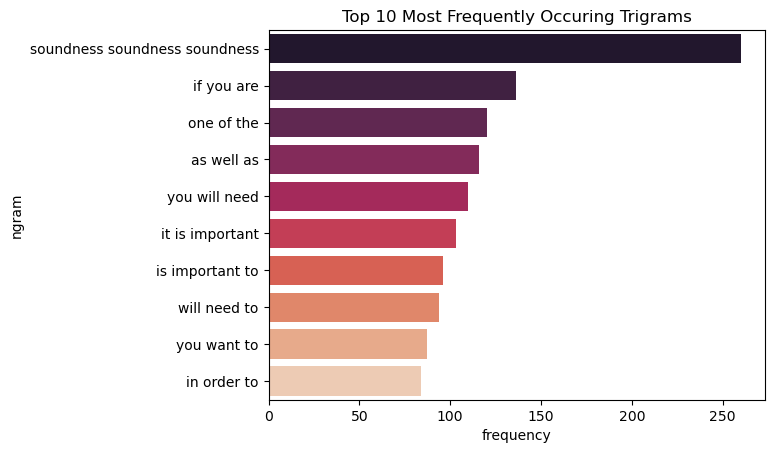

In [ ]:
cv1 = CountVectorizer(ngram_range=(3,3))
trigrams = cv1.fit_transform(train_df_sub['cleaned'])
count_values = trigrams.toarray().sum(axis=0)
ngram_freq = panda.DataFrame(sorted([(count_values[i], k) for k, i in cv1.vocabulary_.items()], reverse = True))
ngram_freq.columns = ["frequency", "ngram"]

sns.barplot(x=ngram_freq['frequency'][:10], y=ngram_freq['ngram'][:10], palette='rocket')
plt.title('Top 10 Most Frequently Occuring Trigrams')
plt.show()

In [5]:
from transformers import RobertaTokenizer, RobertaModel
from transformers import DistilBertTokenizer, DistilBertModel

import sentencepiece
from transformers import get_constant_schedule_with_warmup

In [6]:
model_name = 'distilbert-base-uncased'
tokenizer = DistilBertTokenizer.from_pretrained(model_name)
bert_model = DistilBertModel.from_pretrained(model_name)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

In [7]:
import torch.nn as nn

class BERT_Embedder(nn.Module):
    def __init__(self, bert_modele):
        super(BERT_Embedder, self).__init__()
        self.bert = bert_modele

    def forward(self, encoded_ids,attention_mask):
        outputs = self.bert(encoded_ids,attention_mask)
        last_hidden_states = outputs.last_hidden_state[:,0]  # return embedding of 'CLS' token for classification.

        return last_hidden_states

In [8]:
from torch.utils.data import Dataset, DataLoader
import torch

class SemEval_Dataset(Dataset):
    def __init__(self, json_file,label_list,label_masks,
                 max_seq_length, tokenizer,dtype=torch.long):

        self.json_file = json_file
        self.dtype = dtype
        self.label_list = label_list # [0, 1, 2, 3, 4, 5]
        self.max_seq_length = max_seq_length
        self.tokenizer = tokenizer
        self.label_masks = label_masks

    def __len__(self):
        return len(self.json_file)

    def feature_extractor(self, text, label=None):
        features = []
        tokenized_text = tokenizer(text,padding='max_length', truncation=True,
                                   max_length=self.max_seq_length,
                                   return_tensors="pt")

        input_ids = tokenized_text['input_ids']
        input_mask = tokenized_text['attention_mask']

        if len(input_ids) > self.max_seq_length:
            input_ids = input_ids[0:(self.max_seq_length)]   # crop long sentences
            input_mask = input_mask[0:(self.max_seq_length)]

        assert len(input_ids[0]) == self.max_seq_length
        assert len(input_mask[0]) == self.max_seq_length

        if label != None:
            return input_ids, input_mask, label
        else:
            return input_ids, input_mask

    def __getitem__(self, idx):
        data = self.json_file[idx]
        input_ids, input_mask, label_id = self.feature_extractor(data['text'], label=data['label'])

        return input_ids.squeeze(0), input_mask.squeeze(0), data['label'], self.label_masks[idx]

In [9]:
unlabeled_examples = True
labeled_ratio = 1
train_dataset_size_labeled = int(labeled_ratio* len(train_objects))
label_list = list(range(6))
max_seq_length = 256

#The labeled (train) dataset is assigned with a mask set to True
train_label_masks = torch.ones(train_dataset_size_labeled, dtype=bool)
#If unlabel examples are available
if unlabeled_examples:
  #The unlabeled (train) dataset is assigned with a mask set to False
    tmp_masks = torch.zeros(len(train_objects)- train_dataset_size_labeled , dtype=bool)
    train_label_masks = torch.concatenate([train_label_masks,tmp_masks])
    idx = torch.randperm(train_label_masks.shape[0])
    train_label_masks = train_label_masks[idx].view(train_label_masks.size())

assert train_label_masks.shape[0] == len(train_objects)
train_dataset = SemEval_Dataset(train_objects, label_list, train_label_masks,max_seq_length, tokenizer)

In [10]:
from torch.utils.data import random_split

In [11]:
train_size = int(0.8 * len(train_objects))  # 80% for training
val_size = len(train_objects) - train_size  # Remaining 20% for validation

# train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size])
test_label_masks = torch.ones(len(test_objects), dtype=bool)
test_dataset = SemEval_Dataset(test_objects, label_list, test_label_masks,max_seq_length, tokenizer)

# train_dataloader = DataLoader(dataset=train_dataset, batch_size=batch_size, num_workers=os.cpu_count(),shuffle=True, drop_last=False)
# val_dataloader = DataLoader(dataset=val_dataset, batch_size=batch_size, num_workers=os.cpu_count(),shuffle=True, drop_last=False)
# test_dataloader = DataLoader(dataset=test_dataset, batch_size=batch_size, num_workers=os.cpu_count(),shuffle=True, drop_last=False)

In [12]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = BERT_Embedder(bert_model)
model.to(device)

BERT_Embedder(
  (bert): DistilBertModel(
    (embeddings): Embeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (transformer): Transformer(
      (layer): ModuleList(
        (0-5): 6 x TransformerBlock(
          (attention): MultiHeadSelfAttention(
            (dropout): Dropout(p=0.1, inplace=False)
            (q_lin): Linear(in_features=768, out_features=768, bias=True)
            (k_lin): Linear(in_features=768, out_features=768, bias=True)
            (v_lin): Linear(in_features=768, out_features=768, bias=True)
            (out_lin): Linear(in_features=768, out_features=768, bias=True)
          )
          (sa_layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
          (ffn): FFN(
            (dropout): Dropout(p=0.1, inplace=False)
            (lin1): Linear(in

In [15]:
import tqdm

embeded_data = []

for i in tqdm.tqdm(range(len(train_dataset)), ncols=150, nrows=10, colour='green', smoothing=0.8):
    input_ids, input_mask, label, label_mask = train_dataset[i]
    input_ids = input_ids.to(device)
    input_mask = input_mask.to(device)
    label_mask = label_mask.to(device)

    with torch.no_grad():
        output = model(input_ids.unsqueeze(0), input_mask.unsqueeze(0)).cpu()

    embeded_data.append((output, label, label_mask))


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 71027/71027 [19:20<00:00, 61.22it/s]


In [14]:
import tqdm

embeded_data_test = []

for i in tqdm.tqdm(range(len(test_dataset)), ncols=150, nrows=10, colour='green', smoothing=0.8):
    input_ids, input_mask, label, label_mask = test_dataset[i]
    input_ids = input_ids.to(device)
    input_mask = input_mask.to(device)
    label_mask = label_mask.to(device)

    with torch.no_grad():
        output = model(input_ids.unsqueeze(0), input_mask.unsqueeze(0)).cpu()

    embeded_data_test.append((output, label, label_mask))


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [00:49<00:00, 60.01it/s]


In [ ]:
len(embeded_data[i])

3

In [ ]:
embeded_data

In [17]:
import numpy as np
import random
from copy import deepcopy

In [ ]:
X = np.array(deepcopy(embeded_data))
idx = torch.randperm(len(X))
X = X[idx]
y = y[idx]

<ipython-input-77-5a5d2a14eed8>:1: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  X = np.array(deepcopy(embeded_data))


TypeError: can't convert cuda:0 device type tensor to numpy. Use Tensor.cpu() to copy the tensor to host memory first.

In [18]:
X_data = np.zeros((len(embeded_data),768))
Y_data =  np.zeros(len(embeded_data))
for i,(output, label, label_mask) in  enumerate(embeded_data):
  X_data[i] = output.numpy()
  Y_data[i] = label

In [19]:
X_data.shape, Y_data.shape

((71027, 768), (71027,))

In [20]:
X_data_samlpe.shape

NameError: name 'X_data_samlpe' is not defined

In [ ]:
# idx = np.random.shuffle(idx)
# print(idx)

In [21]:
X_data_samlpe = X_data[Y_data==1]
Y_data_smaple = Y_data[Y_data==1]
arr = np.arange(len(X_data_samlpe))
np.random.shuffle(arr)
arr

array([7549, 6326, 1827, ..., 7819, 6370, 9699])

In [22]:
X_data_samlpe = X_data_samlpe[arr][:100]
Y_data_sample = Y_data_smaple[arr][:100]
X_data_samlpe.shape,Y_data_sample.shape

((100, 768), (100,))

In [23]:
X_data_test = np.zeros((len(embeded_data_test),768))
Y_data_test =  np.zeros(len(embeded_data_test))
for i,(output, label, label_mask) in  enumerate(embeded_data_test):
  X_data_test[i] = output.numpy()
  Y_data_test[i] = label

In [24]:
X_data_test.shape ,Y_data_test.shape

((3000, 768), (3000,))

In [ ]:
X_test_samlpe = X_data_test[Y_data_test==1]
Y_test_sample = Y_data_test[Y_data_test==1]
arr = np.arange(len(X_test_samlpe))
np.random.shuffle(arr)
# arr

In [ ]:
X_test_samlpe = X_test_samlpe[arr][:100]
Y_test_sample = Y_test_sample[arr][:100]
X_test_samlpe.shape,Y_test_sample.shape

((100, 768), (100,))

In [ ]:
Y_test_sample = Y_test_sample+1
Y_test_sample

array([2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
       2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
       2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
       2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
       2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
       2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.])

In [ ]:
X = np.concatenate([X_data_samlpe,X_test_samlpe])
y = np.concatenate([Y_data_sample,Y_test_sample])
X.shape,y.shape

((200, 768), (200,))

In [ ]:
from torch.utils.tensorboard import SummaryWriter

writer = SummaryWriter('runs/LB_embedding')

writer.add_embedding(
    X,
    metadata=y,global_step=1)

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 39629), started 0:25:23 ago. (Use '!kill 39629' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
from torch.utils.tensorboard import SummaryWriter

writer = SummaryWriter('runs/LB_embedding')

writer.add_embedding(
    X_test_samlpe,
    metadata=Y_test_sample,global_step=1)

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 39629), started 0:08:12 ago. (Use '!kill 39629' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
cov_mat = np.cov(X_data.T)

print(cov_mat.shape)
# calculate the eigenvalues and eigenvectors of the covariance matrix
eigenvalues, eigenvectors = np.linalg.eig(cov_mat)

(768, 768)


In [ ]:
explained_variance = 0.7 # you can change this variable to get more component of datasets.
#calculate the total variance from eigenvalues and find the first k component that contains the eplained_variance of the total variance.
#TODO
total_variance = np.sum(eigenvalues)
explained_variance_ratio = np.cumsum(eigenvalues) / total_variance

k = 0

while explained_variance_ratio[k] < explained_variance:
    k += 1

print(f"The first {k+1} components contain at least {explained_variance*100}% of the explained variance.")

#calculate the compression_ratio

The first 37 components contain at least 70.0% of the explained variance.


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [50]:
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

In [5]:
X_data = np.load('/content/drive/MyDrive/X_data.npy')
Y_data = np.load('/content/drive/MyDrive/Y_data.npy')

X_data_test = np.load('/content/drive/MyDrive/X_data_test.npy')
Y_data_test = np.load('/content/drive/MyDrive/Y_data_test.npy')

In [6]:
pca = PCA(n_components=2)  # You can specify the number of components as per your requirement
X_pca = pca.fit_transform(X_data)

In [38]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)  # You can specify the number of components as per your requirement
X_test_pca = pca.fit_transform(X_data_test)

In [37]:
data_ter = np.concatenate([X_pca[:,0:2],np.expand_dims(Y_data,axis=-1), np.expand_dims(traine,axis=-1)],axis=1)
data_ter.shape

(71027, 4)

In [40]:
teste = np.zeros(len(Y_data_test))
data_test = np.concatenate([X_test_pca[:,0:2],np.expand_dims(Y_data_test,axis=-1), np.expand_dims(teste,axis=-1)],axis=1)
data_test.shape

(3000, 4)

In [42]:
data = np.concatenate([data_ter,data_test])
data.shape

(74027, 4)

In [48]:
df = pd.DataFrame(data,columns=['feature1','feature2','lable','train-test'])
df

,feature1,feature2,lable,train-test
0,0.779049,2.011969,1.0,1.0
1,0.642626,2.773541,1.0,1.0
2,0.485785,1.997408,1.0,1.0
3,0.029130,3.172894,1.0,1.0
4,0.176712,2.253820,1.0,1.0
...,...,...,...,...
74022,-0.405988,-1.424366,5.0,0.0
74023,1.311513,0.354433,5.0,0.0
74024,0.615463,-0.734298,5.0,0.0
74025,0.847773,-1.994279,5.0,0.0


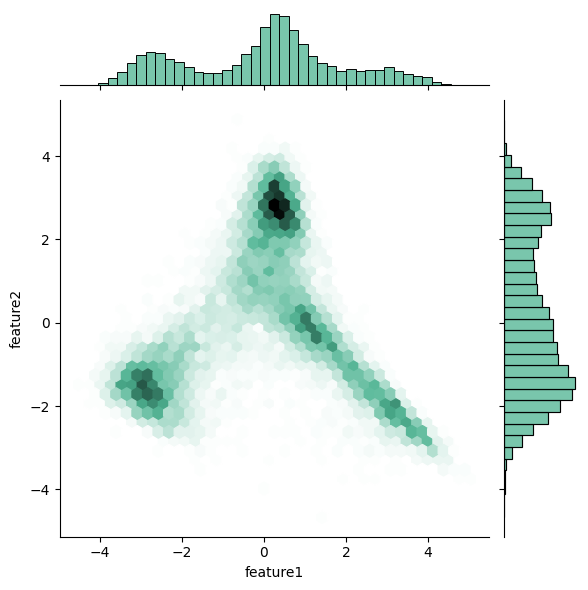

In [87]:
df1 = df[(df['lable']==5)&(df['train-test']==1)]
sns.jointplot(df1,x="feature1", y="feature2", kind="hex", color="#4CB391")
# plt.title('lable 5 ,test_set')

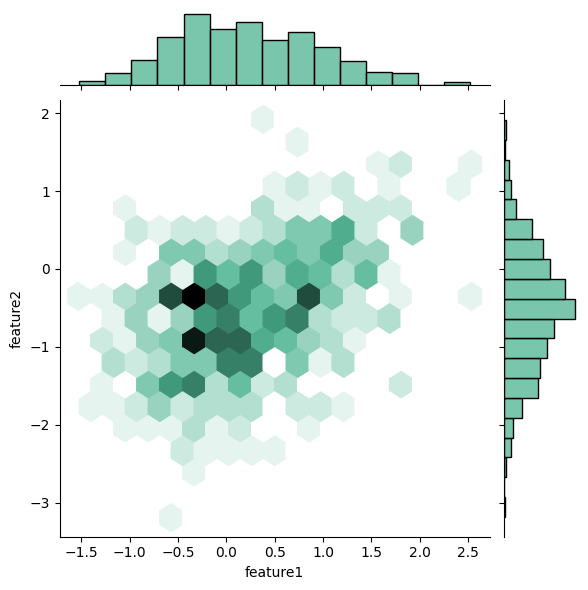

In [62]:
df2 = df[(df['lable']==5)&(df['train-test']==0)]
sns.jointplot(df2,x="feature1", y="feature2", kind="hex", color="#4CB391")

/usr/local/lib/python3.10/dist-packages/seaborn/distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'cols'
  cset = contour_func(


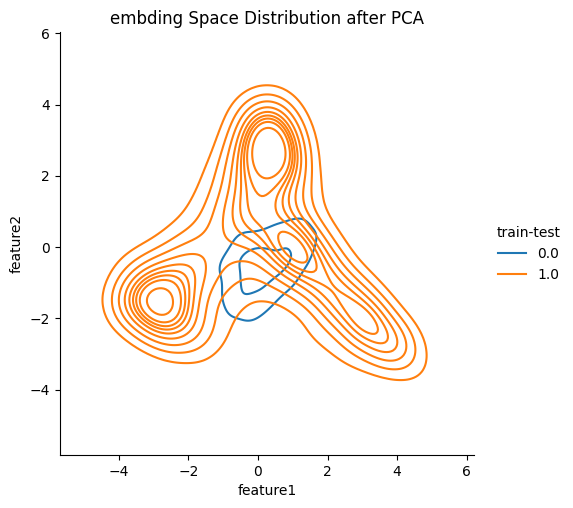

In [57]:
df1 = df[df['lable']==5]
sns.displot(df1,x="feature1", y="feature2", hue="train-test",cols='train-tes',kind="kde").set(title='embding Space Distribution after PCA')

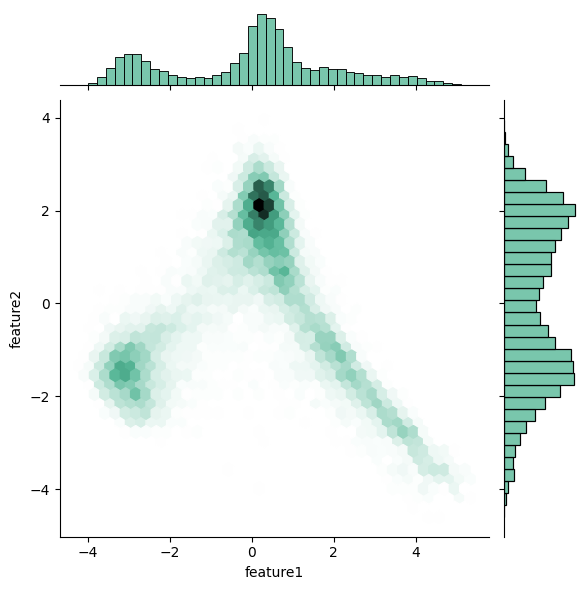

In [63]:
df1 = df[(df['lable']==4)&(df['train-test']==1)]
sns.jointplot(df1,x="feature1", y="feature2", kind="hex", color="#4CB391")

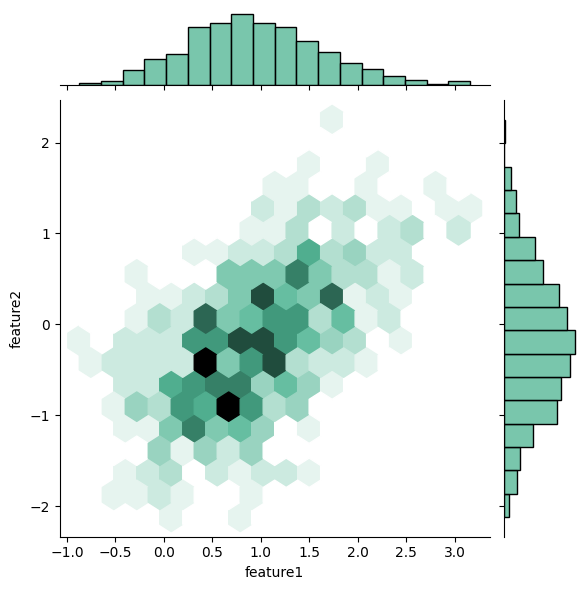

In [64]:
df2 = df[(df['lable']==4)&(df['train-test']==0)]
sns.jointplot(df2,x="feature1", y="feature2", kind="hex", color="#4CB391")

/usr/local/lib/python3.10/dist-packages/seaborn/distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'cols'
  cset = contour_func(


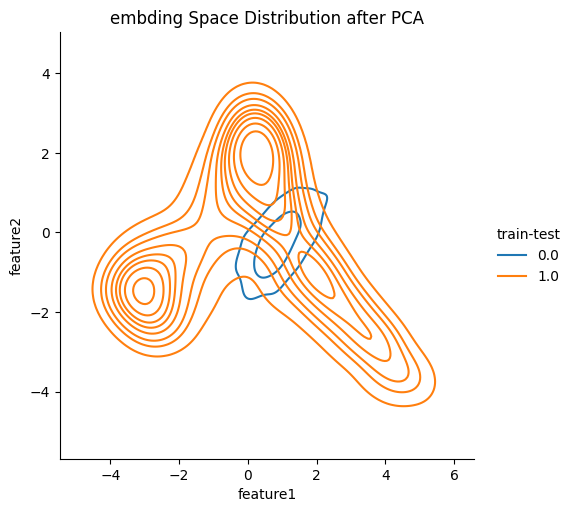

In [65]:
df1 = df[df['lable']==4]
sns.displot(df1,x="feature1", y="feature2", hue="train-test",cols='train-tes',kind="kde").set(title='embding Space Distribution after PCA')

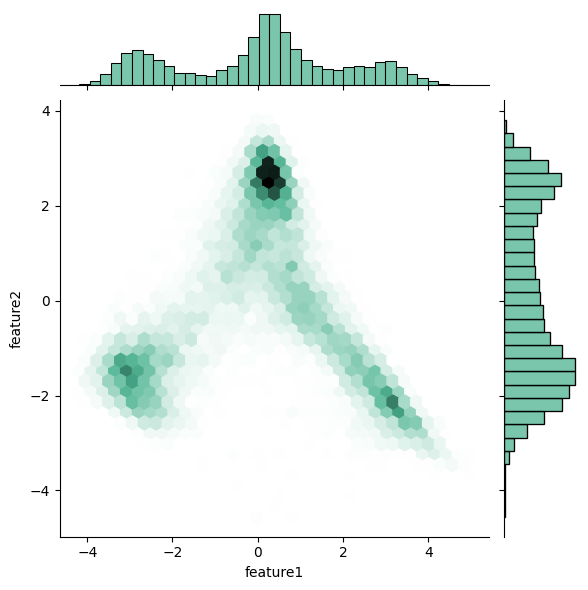

In [66]:
df1 = df[(df['lable']==3)&(df['train-test']==1)]
sns.jointplot(df1,x="feature1", y="feature2", kind="hex", color="#4CB391")

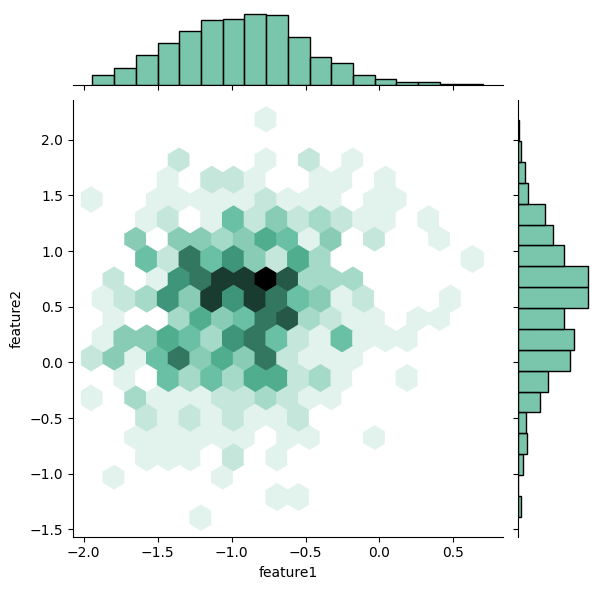

In [67]:
df2 = df[(df['lable']==3)&(df['train-test']==0)]
sns.jointplot(df2,x="feature1", y="feature2", kind="hex", color="#4CB391")

/usr/local/lib/python3.10/dist-packages/seaborn/distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'cols'
  cset = contour_func(


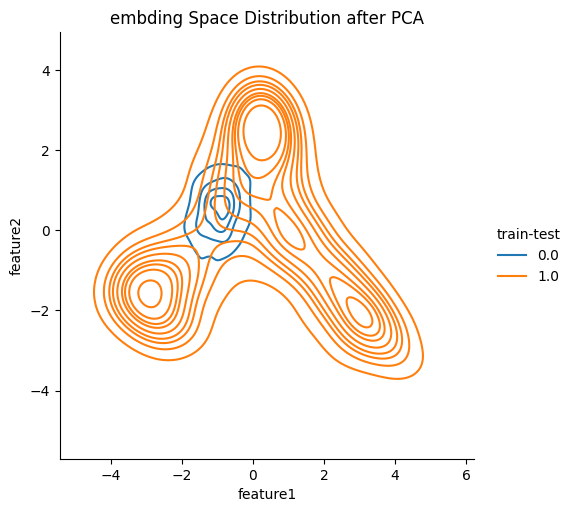

In [68]:
df1 = df[df['lable']==3]
sns.displot(df1,x="feature1", y="feature2", hue="train-test",cols='train-tes',kind="kde").set(title='embding Space Distribution after PCA')

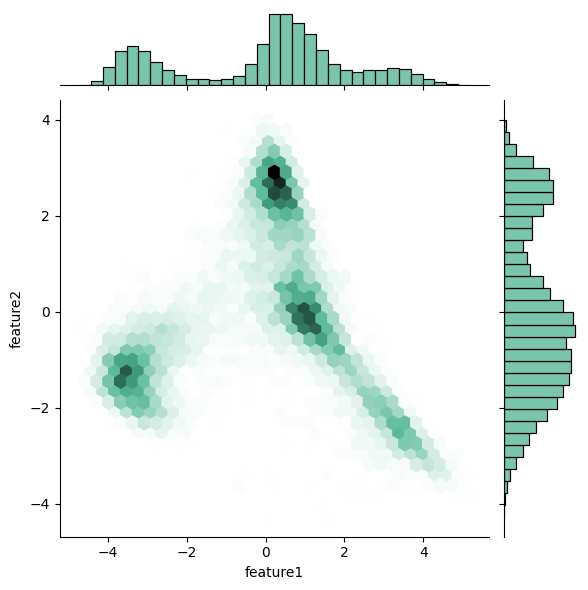

In [69]:
df2 = df[(df['lable']==2)&(df['train-test']==1)]
sns.jointplot(df2,x="feature1", y="feature2", kind="hex", color="#4CB391")

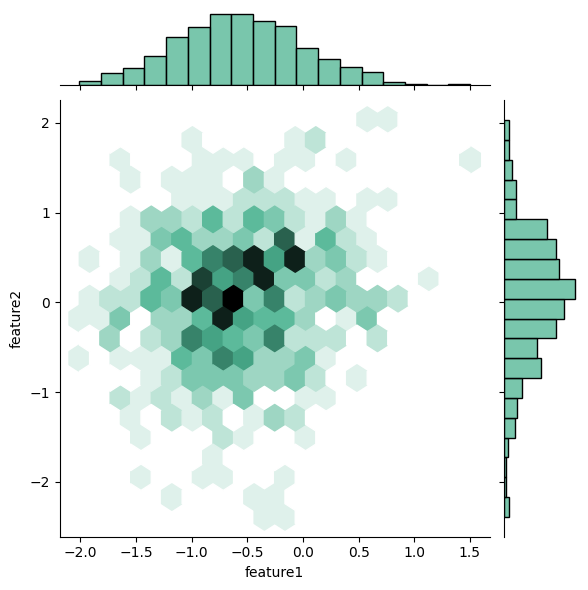

In [70]:
df1 = df[(df['lable']==2)&(df['train-test']==0)]
sns.jointplot(df1,x="feature1", y="feature2", kind="hex", color="#4CB391")

/usr/local/lib/python3.10/dist-packages/seaborn/distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'cols'
  cset = contour_func(


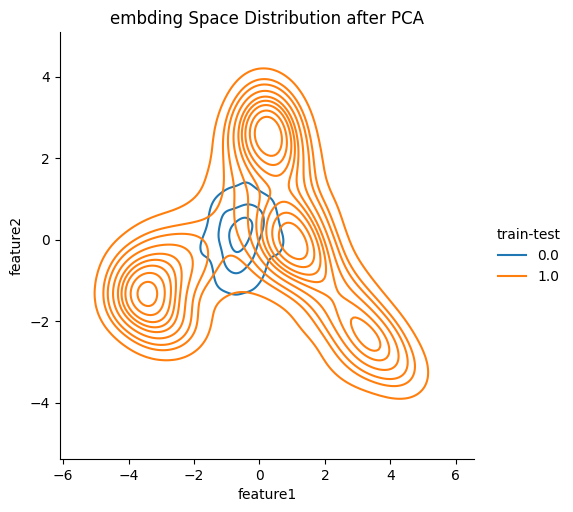

In [71]:
df1 = df[df['lable']==2]
sns.displot(df1,x="feature1", y="feature2", hue="train-test",cols='train-tes',kind="kde").set(title='embding Space Distribution after PCA')

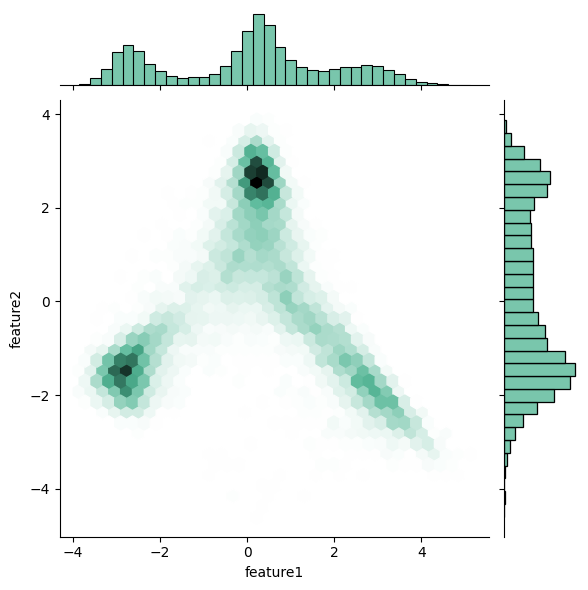

In [72]:
df1 = df[(df['lable']==1)&(df['train-test']==1)]
sns.jointplot(df1,x="feature1", y="feature2", kind="hex", color="#4CB391")

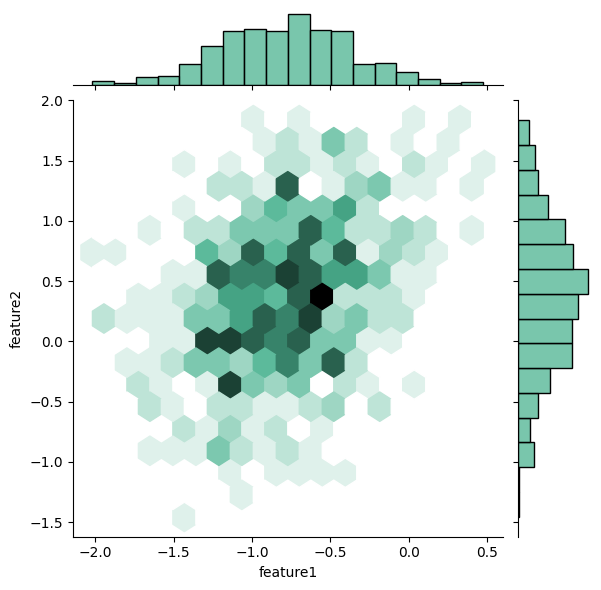

In [73]:
df2 = df[(df['lable']==1)&(df['train-test']==0)]
sns.jointplot(df2,x="feature1", y="feature2", kind="hex", color="#4CB391")

/usr/local/lib/python3.10/dist-packages/seaborn/distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'cols'
  cset = contour_func(


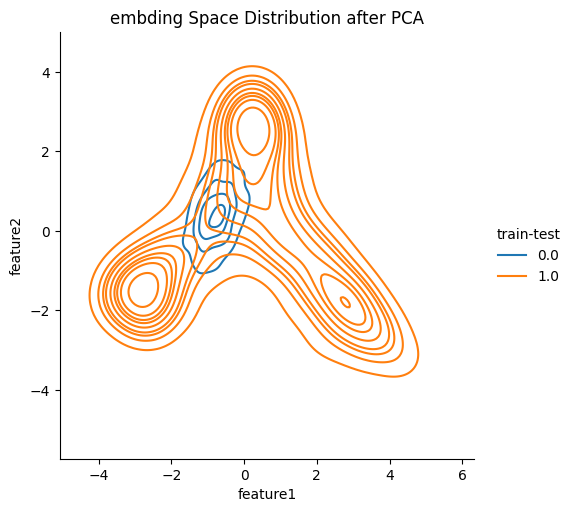

In [74]:
df1 = df[df['lable']==1]
sns.displot(df1,x="feature1", y="feature2", hue="train-test",cols='train-tes',kind="kde").set(title='embding Space Distribution after PCA')

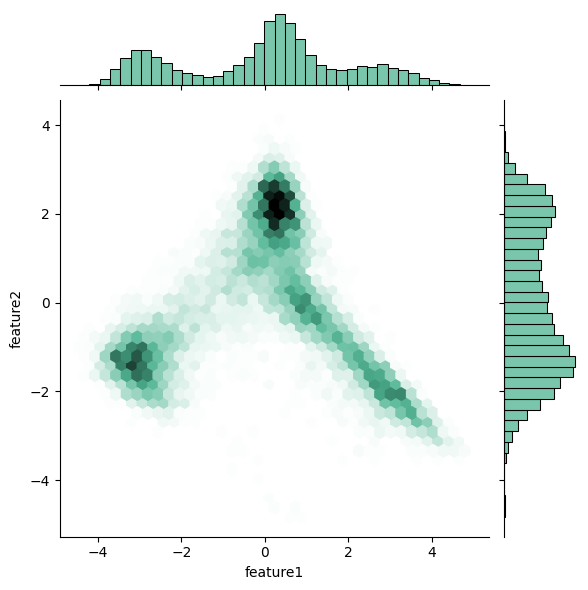

In [75]:
df1 = df[(df['lable']==0)&(df['train-test']==1)]
sns.jointplot(df1,x="feature1", y="feature2", kind="hex", color="#4CB391")

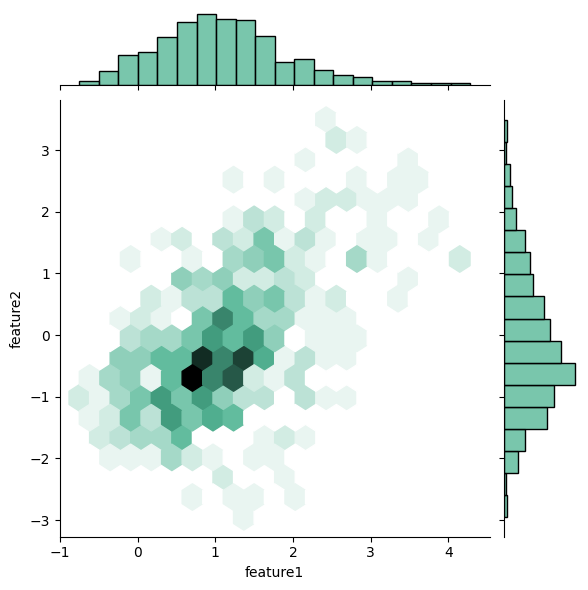

In [77]:
df2 = df[(df['lable']==0)&(df['train-test']==0)]
sns.jointplot(df2,x="feature1", y="feature2", kind="hex", color="#4CB391")

/usr/local/lib/python3.10/dist-packages/seaborn/distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'cols'
  cset = contour_func(


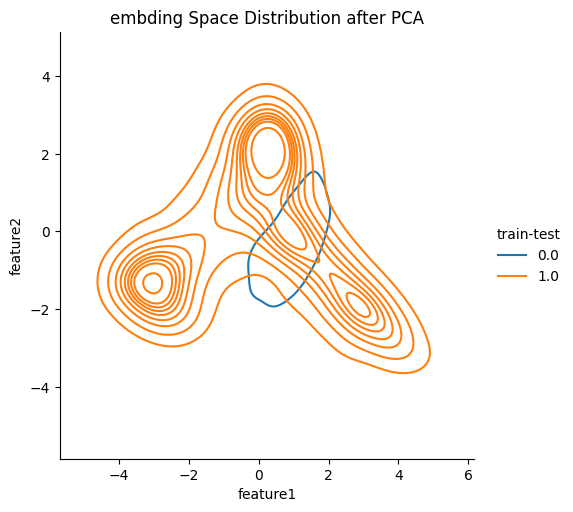

In [76]:
df1 = df[df['lable']==0]
sns.displot(df1,x="feature1", y="feature2", hue="train-test",cols='train-tes',kind="kde").set(title='embding Space Distribution after PCA')

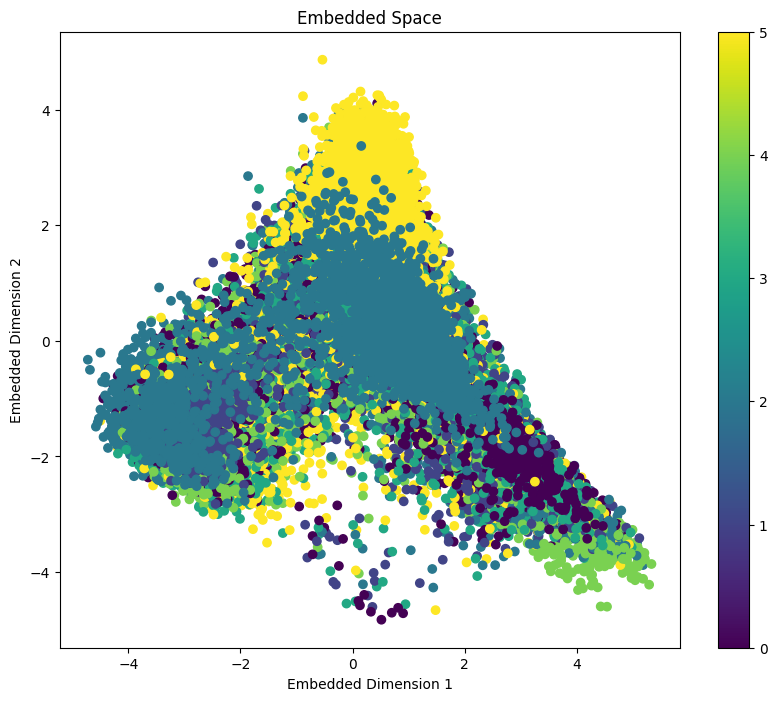

In [13]:
import matplotlib.pyplot as plt

# # Extract the embedded vectors and labels
# embedded_vectors = [data[0] for data in embeded_data]
# labels = [data[1] for data in embeded_data]

# Convert the embedded vectors to numpy array
# embedded_vectors = torch.cat(embedded_vectors).cpu().numpy()
plt.figure(figsize=(10,8))
# Plot the embedded space
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=Y_data)
plt.xlabel('Embedded Dimension 1')
plt.ylabel('Embedded Dimension 2')
plt.title('Embedded Space')
plt.colorbar()
plt.show()


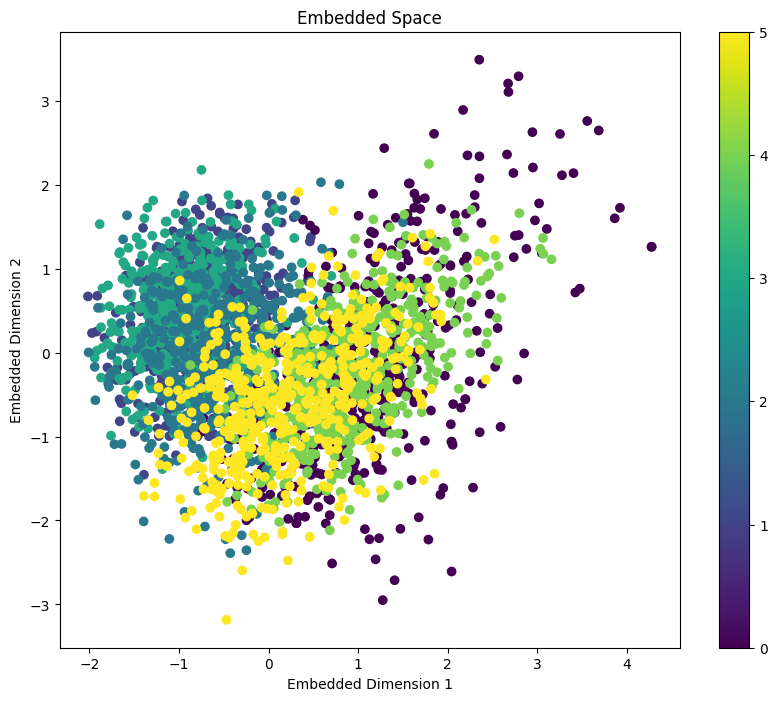

In [14]:
import matplotlib.pyplot as plt

# Plot the embedded space
plt.figure(figsize=(10,8))
plt.scatter(X_test_pca[:, 0], X_test_pca[:, 1], c=Y_data_test)
plt.xlabel('Embedded Dimension 1')
plt.ylabel('Embedded Dimension 2')
plt.title('Embedded Space')
plt.colorbar()
plt.show()


In [80]:
X_pca_5 = X_pca[Y_data==5]
Y_pca_5 = Y_data[Y_data==5]

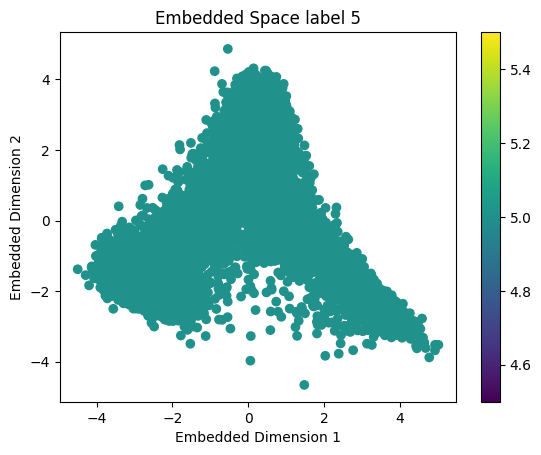

In [82]:
import matplotlib.pyplot as plt

# Extract the embedded vectors and labels
# embedded_vectors = [data[0] for data in embeded_data]
# labels = [data[1] for data in embeded_data]

# Convert the embedded vectors to numpy array
# embedded_vectors = torch.cat(embedded_vectors).cpu().numpy()

# Plot the embedded space
plt.scatter(X_pca_5[:, 0], X_pca_5[:, 1], c=Y_pca_5)
plt.xlabel('Embedded Dimension 1')
plt.ylabel('Embedded Dimension 2')
plt.title('Embedded Space label 5' )
plt.colorbar()
plt.show()


In [84]:
X_test_pca_5 = X_test_pca[Y_data_test==5]
Y_test_pca_5 = Y_data_test[Y_data_test==5]

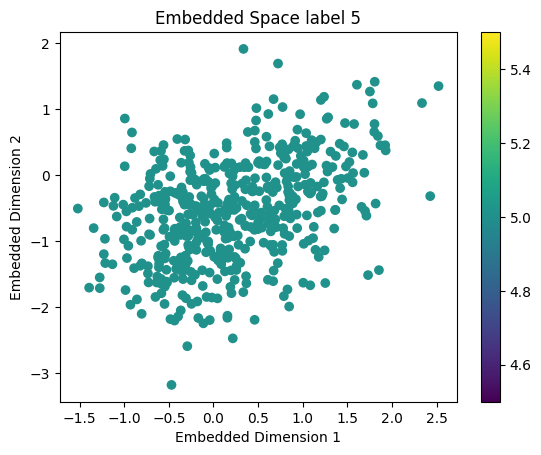

In [85]:
import matplotlib.pyplot as plt

# Extract the embedded vectors and labels
# embedded_vectors = [data[0] for data in embeded_data]
# labels = [data[1] for data in embeded_data]

# Convert the embedded vectors to numpy array
# embedded_vectors = torch.cat(embedded_vectors).cpu().numpy()

# Plot the embedded space
plt.scatter(X_test_pca_5[:, 0], X_test_pca_5[:, 1], c=Y_test_pca_5)
plt.xlabel('Embedded Dimension 1')
plt.ylabel('Embedded Dimension 2')
plt.title('Embedded Space label 5')
plt.colorbar()
plt.show()
